In [ ]:
import cv2 as cv
import numpy as np
import scipy
from google.colab.patches import cv2_imshow
from scipy.optimize import leastsq

In [ ]:
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

def getImagesPoints(imgs, h, w):
    image = imgs.copy()
    all_corners = []
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    #Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (w, h), None)
    if ret == True:
        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        corners2 = corners2.reshape(-1,2)
        # corners2 = np.hstack((corners2.reshape(-1,2), np.ones((corners2.shape[0], 1))))
        all_corners.append(corners2)
    return all_corners

In [ ]:
def newmin(xa):
  global Mcorners,m
  xa = np.append(xa,1)
  hh = np.reshape(xa,(3,3))
  # hh = hh/hh[2,2]
  values = np.matmul(hh,Mcorners.T)
  values = values/values[2,:]
  out1 = m.T - values[0:2,:]
  final_out = out1[0,:]**2 + out1[1,:]**2
  return final_out

In [ ]:
def getV(h):
  V = np.zeros((3,3,6))
  for i in range(3):
    for j in range(3):
      V[i,j,:] = [h[i,0]*h[j,0],
                  h[i,0]*h[j,1] + h[i,1]*h[j,0],
                  h[i,1]*h[j,1],
                  h[i,2]*h[j,0] + h[i,0]*h[j,2],
                  h[i,2]*h[j,1] + h[i,1]*h[j,2],
                  h[i,2]*h[j,2]]
  return V

In [ ]:
x = np.arange(21.5,21.5*7,21.5)
y = np.arange(21.5,21.5*10,21.5)
Mcorners = []
for i in x:
  for j in y:
    Mcorners.append([j,i])    
total_points = len(Mcorners)
Mcorners = np.array(Mcorners)
Mcorners = np.concatenate((Mcorners,np.ones((total_points,1))),axis=1)
print(Mcorners)

[[ 21.5  21.5   1. ]
 [ 43.   21.5   1. ]
 [ 64.5  21.5   1. ]
 [ 86.   21.5   1. ]
 [107.5  21.5   1. ]
 [129.   21.5   1. ]
 [150.5  21.5   1. ]
 [172.   21.5   1. ]
 [193.5  21.5   1. ]
 [ 21.5  43.    1. ]
 [ 43.   43.    1. ]
 [ 64.5  43.    1. ]
 [ 86.   43.    1. ]
 [107.5  43.    1. ]
 [129.   43.    1. ]
 [150.5  43.    1. ]
 [172.   43.    1. ]
 [193.5  43.    1. ]
 [ 21.5  64.5   1. ]
 [ 43.   64.5   1. ]
 [ 64.5  64.5   1. ]
 [ 86.   64.5   1. ]
 [107.5  64.5   1. ]
 [129.   64.5   1. ]
 [150.5  64.5   1. ]
 [172.   64.5   1. ]
 [193.5  64.5   1. ]
 [ 21.5  86.    1. ]
 [ 43.   86.    1. ]
 [ 64.5  86.    1. ]
 [ 86.   86.    1. ]
 [107.5  86.    1. ]
 [129.   86.    1. ]
 [150.5  86.    1. ]
 [172.   86.    1. ]
 [193.5  86.    1. ]
 [ 21.5 107.5   1. ]
 [ 43.  107.5   1. ]
 [ 64.5 107.5   1. ]
 [ 86.  107.5   1. ]
 [107.5 107.5   1. ]
 [129.  107.5   1. ]
 [150.5 107.5   1. ]
 [172.  107.5   1. ]
 [193.5 107.5   1. ]
 [ 21.5 129.    1. ]
 [ 43.  129.    1. ]
 [ 64.5 129. 

In [ ]:
img = cv.imread("IMG_20170209_042606.jpg")
corners = np.array(getImagesPoints(img,6,9))[0,:,:]
print(corners.shape)

(54, 2)


In [ ]:
def getVij(hi, hj):
    Vij = np.array([ hi[0]*hj[0], hi[0]*hj[1] + hi[1]*hj[0], hi[1]*hj[1], hi[2]*hj[0] + hi[0]*hj[2], hi[2]*hj[1] + hi[1]*hj[2], hi[2]*hj[2] ])
    return Vij.T

In [ ]:
def CalculateV(img_path):
  global Mcorners, m, total_points
  img = cv.imread(img_path)
  corners = getImagesPoints(img,6,9)
  m = np.array(corners)[0,:,:]
  # print("m",m)
  L = []
  zrs = np.zeros(3)
  for i in range(len(Mcorners)):
    Mt = Mcorners[i,:].T
    u = m[i,0]
    v = m[i,1]
    # print("uv",u,v,Mt)
    L.append(np.concatenate((Mt,zrs,-1*u*Mt)).tolist())
    L.append(np.concatenate((zrs,Mt,-1*v*Mt)).tolist())
  L = np.array(L)
  # L = L/np.max(L)
  # print("L",L)
  # print(L.shape)
  u, s, vh = np.linalg.svd(L, full_matrices=True)
  # print(len(s))
  # print(vh[len(s)-1])
  # UMat = np.matmul(L.T,L)
  # # UMat = UMat/np.max(UMat[:,:])
  # [V,D] = np.linalg.eig(UMat)
  # xa =abs(D[np.argmin(V),:])
  # h = np.array(xa)
  h0 = vh[-1,0:8]
  ha = leastsq(newmin,h0)#x#np.reshape(x,(3,3)).T
  h = np.append(ha[0],1)
  h = h.reshape((3,3))
  h = h/h[2,2]
  print("h",h)
  h1 = h[:,0]
  h2 = h[:,1]
  h3 = h[:,2]
  v12 = getVij(h1, h2)
  v11 = getVij(h1, h1)
  v22 = getVij(h2, h2)
  bigV = []
  bigV.append(v12.T)
  bigV.append((v11 - v22).T)
  return np.array(bigV),h

In [ ]:
a1,h1 = CalculateV("IMG_20170209_042606.jpg")
a2,h2 = CalculateV("IMG_20170209_042608.jpg")
a3,h3 = CalculateV("IMG_20170209_042612.jpg")
a4,h4 = CalculateV("IMG_20170209_042610.jpg")
print("V",a1)
print("V",a2)
print("V",a3)
print("V",a4)

/usr/local/lib/python3.8/dist-packages/scipy/optimize/minpack.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 1800.
  warnings.warn(errors[info][0], RuntimeWarning)


h [[ 5.92388421e-01  5.51185593e+00  3.06610282e+02]
 [-4.75931677e+00  1.96646774e-02  1.51395102e+03]
 [ 5.15719360e-04 -9.74682091e-05  1.00000000e+00]]
h [[ 9.78728892e-01  6.26616193e+00  2.13922484e+02]
 [-4.50996002e+00  2.24826793e-01  1.60117638e+03]
 [ 9.98502796e-04  5.93253139e-06  1.00000000e+00]]
h [[ 1.39384203e+00  7.49335106e+00  1.75422606e+02]
 [-3.68273501e+00  5.83403089e-01  1.46528920e+03]
 [ 1.84792675e-03  2.53466410e-04  1.00000000e+00]]
h [[ 1.37765340e+00  6.82505436e+00  1.94623653e+02]
 [-4.03975758e+00  5.99727487e-01  1.46934150e+03]
 [ 1.44033400e-03  1.46343339e-04  1.00000000e+00]]
V [[ 3.26515963e+00 -2.62210192e+01 -9.35904289e-02  2.78483178e-03
   4.74023537e-04 -5.02662425e-08]
 [-3.00296317e+01 -5.85550602e+00  2.26507094e+01  1.68547381e-03
  -4.90511024e-03  2.56466407e-07]]
V [[ 6.13287372e+00 -2.80400953e+01 -1.01395985e+00  6.26258655e-03
   1.97734702e-04  5.92364918e-09]
 [-3.83068751e+01 -1.16456585e+01  2.02891923e+01  1.88017867e-03
  

In [ ]:
final_V = np.concatenate((a1,a2,a3,a4),axis=0)

In [ ]:
print(final_V.shape)

(8, 6)


In [ ]:
u, s, vh = np.linalg.svd(final_V)
b =vh[-1,:]
print(b)

[ 1.47725311e-07 -2.92080417e-10  1.49405622e-07 -1.17727767e-04
 -2.03537361e-04  9.99999972e-01]


In [ ]:
B = np.zeros((3,3))
B[0,0] = b[0]
B[0,1] = b[1]
B[0,2] = b[3]
B[1,0] = b[1]
B[1,1] = b[2]
B[1,2] = b[4]
B[2,0] = b[3]
B[2,1] = b[4]
B[2,2] = b[5]
print(B/B[2,2])

[[ 1.47725315e-07 -2.92080425e-10 -1.17727770e-04]
 [-2.92080425e-10  1.49405626e-07 -2.03537367e-04]
 [-1.17727770e-04 -2.03537367e-04  1.00000000e+00]]


In [ ]:
v0 = (B[0,1]*B[0,2] - B[0,0]*B[1,2])/(B[0,0]*B[1,1] - B[0,1]**2)

In [ ]:
lamb = B[2,2] - ((B[0,2]**2 + v0*(B[0,1]*B[0,2] - B[0,0]*B[1,2]))/B[0,0])

In [ ]:
v0 = (B[0,1] * B[0,2] - B[0,0] * B[1,2])/(B[0,0] * B[1,1] - B[0,1]**2)
lamb = B[2,2] - (B[0,2]**2 + v0 * (B[0,1] * B[0,2] - B[0,0] * B[1,2]))/B[0,0]
alpha = np.sqrt(lamb/B[0,0])
beta = np.sqrt(lamb * (B[0,0]/(B[0,0] * B[1,1] - B[0,1]**2)))
gamma = -(B[0,1] * alpha**2 * beta) / lamb 
u0 = (gamma * v0 / beta) - (B[0,2] * alpha**2 / lamb)

print(lamb)
print(B[0,0])

A = np.array([[alpha, gamma, u0], [0, beta, v0], [0, 0, 1]])
print(A)

0.6282609284037782
1.477253109840821e-07
[[2.06225597e+03 4.05447776e+00 7.99633642e+02]
 [0.00000000e+00 2.05063042e+03 1.36387718e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [ ]:
Ainv = np.linalg.inv(A)
print(Ainv)

[[ 4.84905858e-04 -9.58749076e-07 -3.86439421e-01]
 [ 0.00000000e+00  4.87654914e-04 -6.65101408e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [ ]:
H = h2
print(H)
H1 = H[:,0]
H2 = H[:,1]
H3 = H[:,2]
print(H1,H2,H3)

[[ 9.78728892e-01  6.26616193e+00  2.13922484e+02]
 [-4.50996002e+00  2.24826793e-01  1.60117638e+03]
 [ 9.98502796e-04  5.93253139e-06  1.00000000e+00]]
[ 9.78728892e-01 -4.50996002e+00  9.98502796e-04] [6.26616193e+00 2.24826793e-01 5.93253139e-06] [2.13922484e+02 1.60117638e+03 1.00000000e+00]


In [ ]:
R1 = np.matmul(Ainv,H1)
lamb = np.linalg.norm(R1, 2)
R1 = R1/lamb
R2 = np.matmul(Ainv,H2)
R2 = R2/lamb
R3 = np.cross(H1,H2)
T = np.matmul(Ainv,H3)/lamb
print(R1)
print(R2)
print(T)
R = np.concatenate((R1.T,R2.T,T.T)).reshape((3,3)).T
print(R)

[ 0.03067117 -0.94379297  0.32911109]
[1.00067637 0.03483662 0.00195539]
[-93.68755702  38.1418822  329.60457679]
[[ 3.06711728e-02  1.00067637e+00 -9.36875570e+01]
 [-9.43792969e-01  3.48366182e-02  3.81418822e+01]
 [ 3.29111091e-01  1.95538950e-03  3.29604577e+02]]


In [ ]:
def distortion(R2,A,img_path):
  global Mcorners, m, total_points
  RTA = np.matmul(A,R2)
  img = cv.imread(img_path)
  corners = getImagesPoints(img,6,9)
  m = np.array(corners)[0,:,:]
  uvw = np.matmul(RTA,Mcorners.T).T
  print(uvw.shape)
  u = uvw[:,0]/uvw[:,2]
  v = uvw[:,1]/uvw[:,2]
  xyz = np.matmul(R2,Mcorners.T).T
  print(xyz.shape)
  x = xyz[:,0]/xyz[:,2]
  y = xyz[:,1]/xyz[:,2]
  r = x**2 + y**2
  uu0 = u - A[0,2]
  vv0 = v - A[1,2]
  D = []
  d = []
  for i in range(uu0.shape[0]):
    e1 = uu0[i]*r[i]
    e2 = e1*r[i]
    e3 = vv0[i]*r[i]
    e4 = e3*r[i]
    D.append([e1,e2])
    D.append([e3,e4])
    d.append(m[i,0] - u[i])
    d.append(m[i,1] - v[i])
  D = np.array(D)
  DTD = np.matmul(D.T,D)
  Dinv = np.linalg.inv(DTD)
  DinvDT = np.matmul(Dinv,D.T)
  K = np.matmul(DinvDT,d)
  return K

In [ ]:
K = distortion(R,A,"IMG_20170209_042606.jpg")

(54, 3)
(54, 3)


In [ ]:
print(K)

[ 0.01822498 -0.12084292]


[[ 3.22593522e+02  2.06535565e+03  7.05098297e+04]
 [-1.48650346e+03  7.41039399e+01  5.27755063e+05]
 [ 3.29111091e-01  1.95538950e-03  3.29604577e+02]]


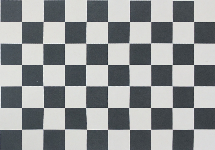

In [ ]:
img = cv.imread("IMG_20170209_042608.jpg")
RTA = np.matmul(A,R)
print(RTA)
inv = np.linalg.inv(RTA)
a = cv.warpPerspective(img,inv,dsize=(215,int(21.5*7)))
cv2_imshow(a)

In [ ]:
def distortion(FLmat):
  len = FLmat.shape[0]
  Fmat = np.reshape(FLmat,(len//9,9))
  A = np.reshape(Fmat[0],(3,3))
  R = np.reshape(Fmat[1],(3,3))
  global Mcorners, m, total_points,img_path,K
  RTA = np.matmul(A,R)
  img = cv.imread(img_path)
  corners = getImagesPoints(img,6,9)
  m = np.array(corners)[0,:,:]
  uvw = np.matmul(RTA,Mcorners.T).T
  # print(uvw.shape)
  u = uvw[:,0]/uvw[:,2]
  v = uvw[:,1]/uvw[:,2]
  xyz = np.matmul(R,Mcorners.T).T
  x = xyz[:,0]/xyz[:,2]
  y = xyz[:,1]/xyz[:,2]
  r = x**2 + y**2
  # print(r.shape)
  uu0 = u - A[0,2]
  vv0 = v - A[1,2]
  kr = K[0]*r + K[1]*(r**2)
  u_hat = u + uu0*kr
  v_hat = v + uu0*kr
  # print(u_hat.shape)
  # print(u.shape)
  # print(uu0.shape)
  ex = m[:,0] - u_hat
  ey = m[:,1] - v_hat
  error = ex**2 + ey**2
  return error

In [ ]:
A0 = np.reshape(A,(9,1))
R0 = np.reshape(R,(9,1))
FLMat0 = np.append(A,R)
img_path = "IMG_20170209_042606.jpg"
distortion(FLMat0)

(54, 3)


array([1.20249685e+00, 5.91368612e-01, 1.55816189e-01, 4.95990410e-02,
       3.23034664e-02, 8.78055095e-01, 4.28469497e-01, 3.69760052e-01,
       2.15576594e-01, 1.14694478e+00, 1.40306574e+00, 1.35741830e+00,
       5.47734572e-01, 7.87359762e-01, 3.35839320e-02, 5.23148426e-01,
       4.84424604e-02, 6.43718709e-03, 3.26811975e-02, 6.30483127e-01,
       1.02653149e+00, 7.48816788e-01, 4.25644799e-01, 6.17655450e-02,
       6.33822844e-01, 1.69586528e-01, 6.88594209e-02, 1.18827751e+00,
       9.38929998e-01, 1.78605574e+00, 7.87326886e-01, 3.60107305e-01,
       7.99039452e-01, 1.21845775e+00, 2.17998168e-01, 5.21495186e-01,
       7.84818653e-01, 8.07649389e-01, 4.40507212e-01, 4.27756257e-01,
       2.09718765e-01, 9.08337319e-04, 4.07140198e-01, 2.69040362e-03,
       1.46484133e+00, 2.78873650e-02, 1.60900036e-01, 8.46850939e-02,
       7.89704050e-01, 2.05673064e+00, 1.54193476e+00, 9.93057546e-01,
       1.06733448e-01, 2.34306478e+00])

In [ ]:
correct = leastsq(distortion,FLMat0)

/usr/local/lib/python3.8/dist-packages/scipy/optimize/minpack.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 3800.
  warnings.warn(errors[info][0], RuntimeWarning)


In [ ]:
distortion(correct[0])

array([1.10657071e+00, 5.26746465e-01, 2.20893243e-01, 2.72429892e-04,
       1.10101125e-01, 1.15889396e+00, 5.38096410e-01, 3.97854590e-01,
       2.36644254e-01, 9.93931550e-01, 1.03710050e+00, 9.71865875e-01,
       3.40401790e-01, 5.56203439e-01, 6.67607175e-02, 6.25625289e-01,
       6.50762124e-02, 1.50849041e-02, 7.53502937e-03, 5.31473858e-01,
       9.10672757e-01, 6.76601290e-01, 4.13130679e-01, 1.13127376e-01,
       8.14895686e-01, 2.76376276e-01, 1.29260546e-01, 1.18427179e+00,
       1.05140850e+00, 1.89334140e+00, 8.45362034e-01, 4.33720940e-01,
       9.22558925e-01, 1.33792167e+00, 3.19347951e-01, 5.55807270e-01,
       5.47980428e-01, 6.15663001e-01, 4.42728933e-01, 4.92729194e-01,
       2.39192638e-01, 1.65228464e-03, 4.21834345e-01, 6.34402519e-03,
       1.36816463e+00, 1.81277433e-01, 2.17567732e-01, 2.66379833e-02,
       7.45834728e-01, 2.02416776e+00, 1.55956883e+00, 1.05668994e+00,
       1.58136521e-01, 2.21803911e+00])

In [ ]:
Ka = np.array(A, np.float32).reshape(3,3)
D = np.array([K[0],K[1], 0, 0] , np.float32)

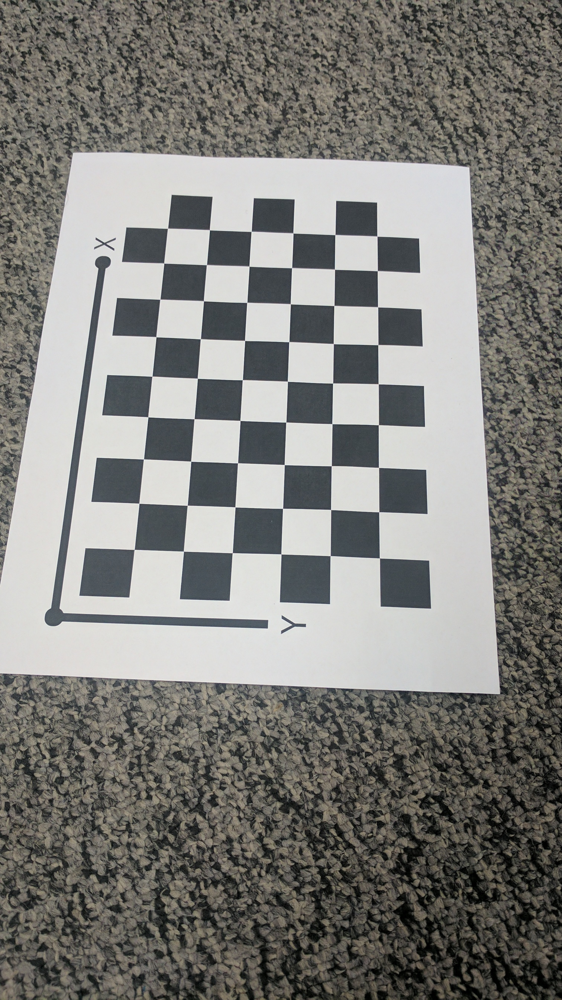

In [ ]:
cv2_imshow(img)

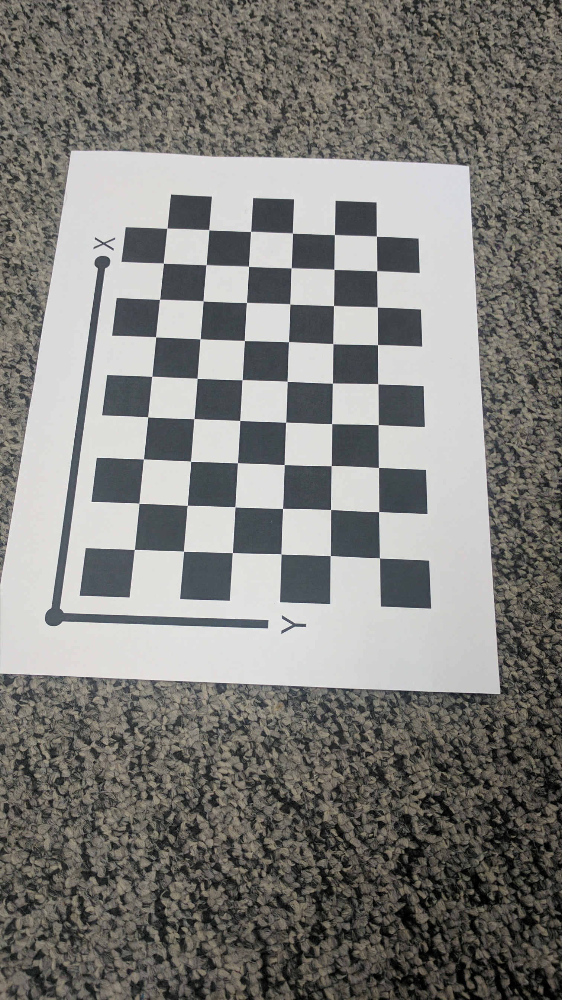

In [ ]:
img = cv.imread("IMG_20170209_042608.jpg")
a = cv.undistort(img, Ka, D)
cv2_imshow(a)